# assignment 3 - image processing
# Farimah Rashidi(99222040)

*   ***Question1:***




In [61]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

path_img1 = './portrait1.jpg'
path_img2 = './portrait2.jpg'
portrait1 = cv2.imread(path_img1, cv2.IMREAD_GRAYSCALE)
portrait2 = cv2.imread(path_img2, cv2.IMREAD_GRAYSCALE)

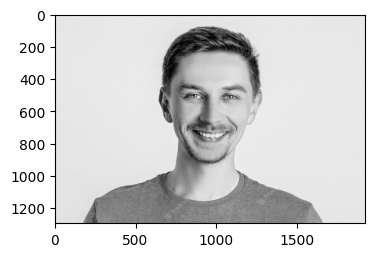

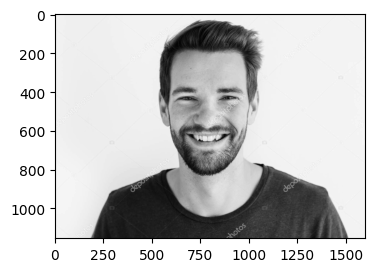

In [62]:
def plot_image(image):
    fig = plt.figure(figsize=(4,4))
    plt.imshow(image, cmap='gray')
    plt.show()

plot_image(portrait1)
plot_image(portrait2)

As you can see, images are different in sizes. So we should resize them

In [63]:
def resize(portrait1, portrait2):
    target_width = min(portrait1.shape[1], portrait2.shape[1])
    target_height = min(portrait1.shape[0], portrait2.shape[0])

    resized_portrait1 = cv2.resize(portrait1, (target_width, target_height))
    resized_portrait2 = cv2.resize(portrait2, (target_width, target_height))

    return resized_portrait1, resized_portrait2


The resize function takes two input images, portrait1 and portrait2, and ensures that they have the same dimensions by resizing them. It determines the target width and height by selecting the minimum width and height values between the two images. Using the OpenCV library's cv2.resize function, the images are then resized to the target dimensions.

In [64]:
def plot_images(images):
    fig = plt.figure(figsize=(10, 7))

    for i in range(len(images)):
        
        fig.add_subplot(1, 3, i+1)
        plt.imshow(images[i], cmap = plt.cm.gray)

    plt.show()

In [65]:
def filtering_low_pass(portrait, kernel_size):
    blurred = cv2.GaussianBlur(portrait, (kernel_size, kernel_size), 0)
    plot_image(blurred)
    return blurred

def filtering_high_pass(portrait, kernel_size):
    blurred = cv2.GaussianBlur(portrait, (kernel_size, kernel_size), 0)    
    laplacian = cv2.Laplacian(blurred, cv2.CV_64F)
    sharpened = np.clip(portrait - laplacian, 0, 255).astype(np.uint8)
    plot_images([blurred, laplacian, sharpened])
    return sharpened

The filtering_low_pass function applies a low-pass filter to the input image using a Gaussian blur. It takes an image and a kernel size as parameters. The image is smoothed by convolving it with a Gaussian kernel of the specified size, which helps to reduce high-frequency noise and smooth out the image.

The filtering_high_pass function performs a high-pass filter operation on the input image. It first applies a Gaussian blur to the image using the specified kernel size. Then, it calculates the Laplacian of the blurred image to highlight the high-frequency components or edges. Finally, it subtracts the Laplacian from the original image and performs a clipping operation to ensure the pixel values are within the valid range of 0 to 255. The resulting sharpened image, emphasizes the edges and details.

In [72]:
def hybrid_portrait(portrait1, portrait2):
    resized_portrait1, resized_portrait2 = resize(portrait1, portrait2)
    
    kernel_size = 15
    filtered_portrait1 = filtering_low_pass(resized_portrait1, kernel_size)

    kernel_size = 5
    filtered_portrait2 = filtering_high_pass(resized_portrait2, kernel_size)
    
    combined_portrait = cv2.addWeighted(filtered_portrait1, 0.5, filtered_portrait2, 0.5, 0)
    return combined_portrait

this function creates a hybrid image that combines the low-frequency content from one image and the high-frequency content from another image, resulting in an image that can exhibit different interpretations depending on the viewing distance or scale.

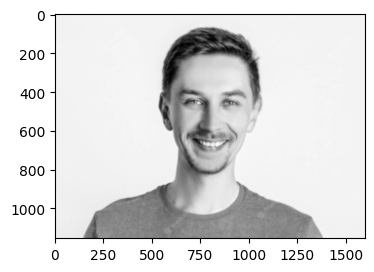

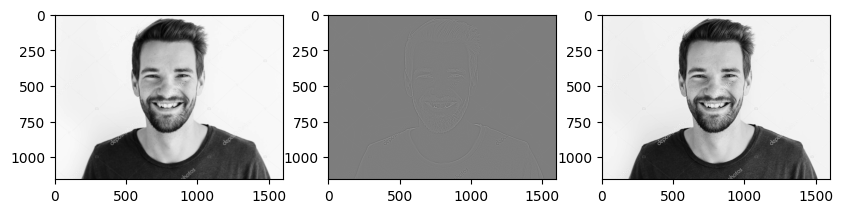

In [73]:
combined_portrait = hybrid_portrait(portrait1, portrait2)

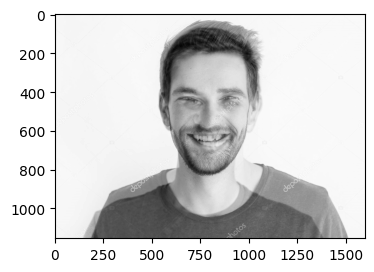

In [75]:
plot_image(combined_portrait)

As you can see, we have combined photo now.

*   ***Question2:*** 

In [32]:
import pandas as pd 
import seaborn as sns
import os
from google.colab import drive 
import glob
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [24]:
drive.mount('content')

Drive already mounted at content; to attempt to forcibly remount, call drive.mount("content", force_remount=True).


In [25]:
path = "/content/content/MyDrive/NISTSpecialDatabase4GrayScaleImagesofFIGS"
images = glob.glob(path + '/**/*.png', recursive=True)
texts = glob.glob(path + '/**/*.txt', recursive=True)

In [28]:
#sample
images = images[:120]

In [30]:
def image_to_binary(image, threshold):
    _, binary_image = cv2.threshold(image, threshold, 255, cv2.THRESH_BINARY)
    return binary_image

threshold = 100
b_img = [image_to_binary(cv2.imread(i, 0), threshold) for i in images]

In [14]:
def morphology(binary_image):
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    morph_image = cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, kernel)
    return morph_image

m_img = [morphology(i) for i in b_img]

morphology applies morphological opening, a combination of erosion and dilation, using a 3x3 rectangular kernel, to a binary image. It then creates a list comprehension to iterate over a list of binary images and applies the morphology function to each image, collecting the resulting morphologically processed images in a new list called m_img.

In [15]:
def edges(image):
    edges_image = cv2.Canny(image, 100, 200)
    return edges_image

e_img = [edges(i) for i in m_img]

Then we use an edge detection function which applies the Canny edge detection algorithm to a list of morphologically processed images, producing a new list of edge-detected images. (You can see the code of this part in code file).

We can see the results until here:

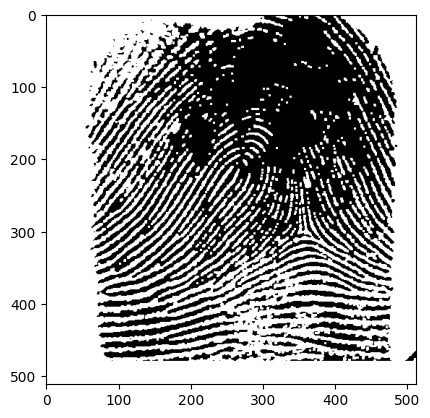

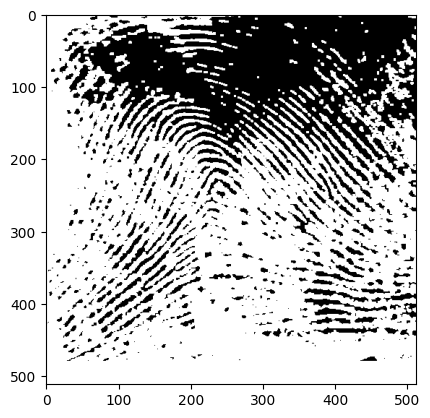

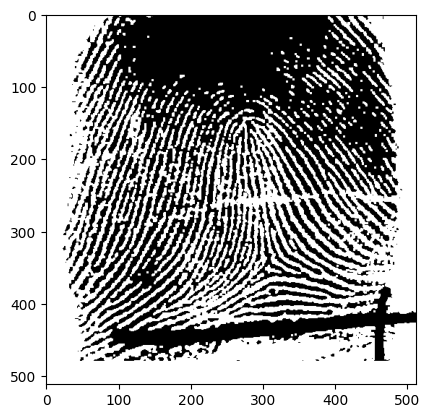

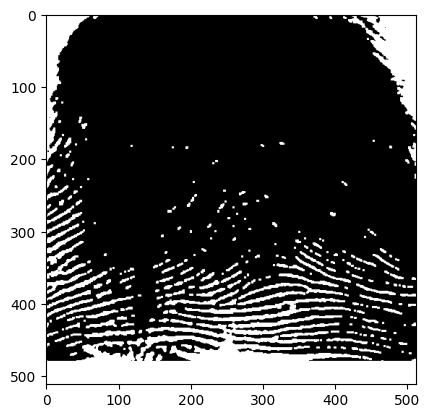

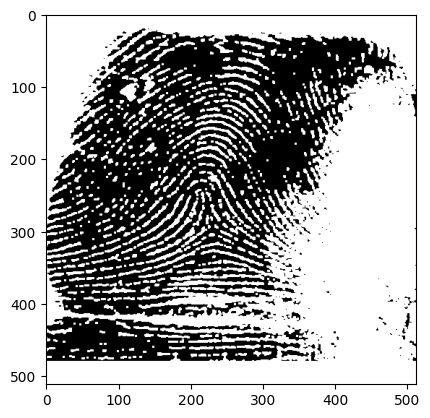

...

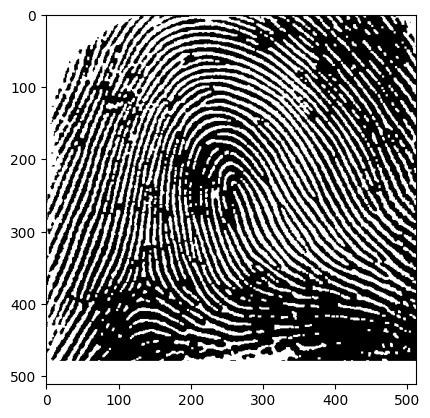

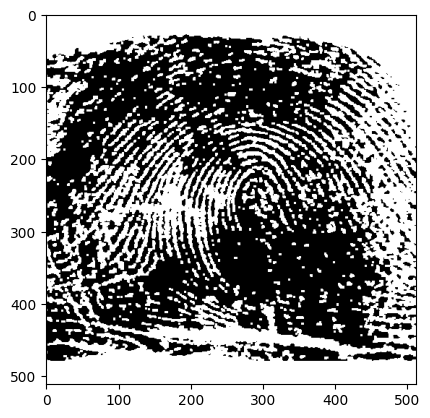

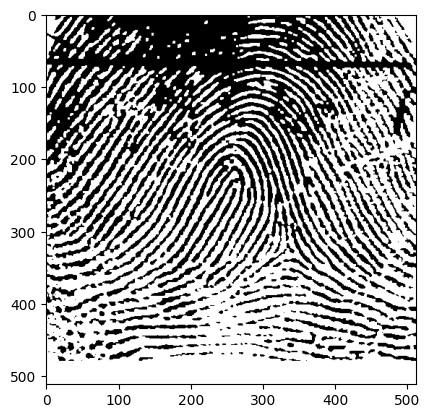

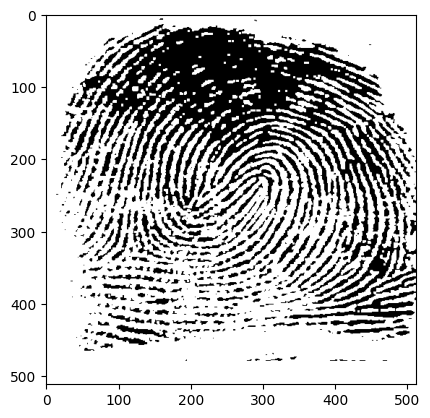

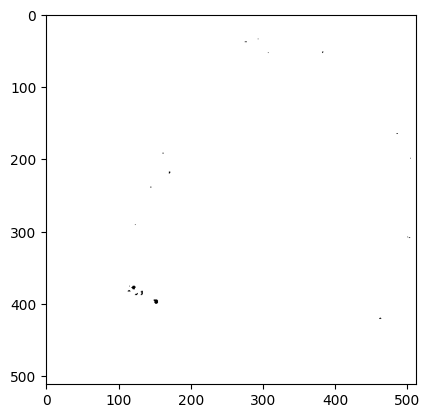

In [13]:
for i in m_img:
    plt.imshow(i, cmap='gray')
    plt.show()